<h1> BrainStation Capstone Project</h1>

<b>Is the song "hot enough" for Billboard Hot100 🔥</b>
<br> Predicing the probability of a song reaching the Billboard Hot100 chart.</br>

Author: Hailey Lee
<br>Contact: ejlee.hailey@gmail.com
<br>Date: July 5, 2022

---

# Data Visualization

This workbook holds various analyses on our datasets and uses different visualization techniques for each.

---
#### Table of Contents:
* [Release Year vs. Billboard Year](#releasevsbillboard)
* [Best Time to Release Songs](#poprelease)
* [Billboard Music Genre Mix](#genre)
* [Artists that Appeared on Billboard Hot100](#artists)
* [Duration of Song Listings on Billboard Hot100](#duration)
* [Song Topic Trends](#topics)

---

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.graph_objects as go
import plotly.express as px

from wordcloud import WordCloud, STOPWORDS

from datetime import datetime 
import calendar

# display full columns
pd.set_option('display.max_columns', None)

import warnings
warnings.filterwarnings("ignore")

In [2]:
songs_df = pd.read_csv("capstone_dataset_clean.csv", encoding ="latin1")
artist_df = pd.read_csv('capstone_dataset_artists.csv')

In [3]:
artist_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3191 entries, 0 to 3190
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   artist_uri         3191 non-null   object
 1   artist             3191 non-null   object
 2   artist_popularity  3191 non-null   int64 
 3   artist_followers   3191 non-null   int64 
 4   artist_genre       3191 non-null   object
 5   major_label        3191 non-null   int64 
dtypes: int64(3), object(3)
memory usage: 149.7+ KB


In [4]:
songs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13807 entries, 0 to 13806
Data columns (total 44 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   billboard          13807 non-null  int64  
 1   billboard_year     13807 non-null  int64  
 2   billboard_month    13807 non-null  int64  
 3   peak_position      13807 non-null  int64  
 4   weeks_on_chart     13807 non-null  int64  
 5   artist             13807 non-null  object 
 6   feat_artist        13807 non-null  object 
 7   artist_uri         13807 non-null  object 
 8   artist_popularity  13807 non-null  int64  
 9   artist_followers   13807 non-null  int64  
 10  song               13807 non-null  object 
 11  track_uri          13807 non-null  object 
 12  track_popularity   13807 non-null  int64  
 13  album_name         13807 non-null  object 
 14  release_year       13807 non-null  int64  
 15  release_month      13807 non-null  int64  
 16  duration_ms        138

---
### Analysis on Release Year vs. Billboard Year<a class="anchor" id="releasevsbillboard"></a>

Recall the negative coefficient `release_year` in our models. Below is a deep dive to see the relationship between `release_year` and `billboard_year`. The graph is interactive so you can hover over the points to see song details.

In [5]:
bb_df = songs_df[(songs_df['billboard_year'] != 0) & (songs_df['release_year'] !=0)]

bb_df['billboard_yearmonth'] = pd.to_datetime(bb_df['billboard_year'].astype(str) + '/' + bb_df['billboard_month'].astype(str) + '/01')
bb_df['release_yearmonth'] = pd.to_datetime(bb_df['release_year'].astype(str) + '/' + bb_df['release_month'].astype(str) + '/01')

In [6]:
fig = px.scatter(data_frame=bb_df,
                 x='billboard_yearmonth',
                 y='release_yearmonth',
                 hover_data=[bb_df['song'],bb_df['artist']],
                 title='Relationship: Billboard Year vs. Release Year',
                 color='billboard_month',
                 labels={
                     'billboard_yearmonth':'Billboard Month/Year',
                     'release_yearmonth':'Release Month/Year',
                 'billboard_month':'Month (1-12)'})

fig.update_xaxes(linewidth = 1, linecolor ='black')
fig.update_yaxes(linewidth = 1, linecolor ='black')
fig.show()

Based on the darker indigo data points, we can claim that most of the older songs appeared on the Billboard during the earlier months of the year (i.e. January). 

First, let's filter the noise (songs released before 2007) and see if there is a clearer relationship:

In [7]:
release_df = bb_df[(bb_df['billboard_year'] != 0) & (bb_df['release_year'] > 2007)]

fig = px.scatter(data_frame=release_df,
                 x='billboard_yearmonth',
                 y='release_yearmonth',
                 hover_data=[release_df['song'],release_df['artist']],
                 title='Relationship: Billboard Year vs. Release Year (After 2007)',
                 labels={
                     'billboard_yearmonth':'Billboard Month/Year',
                     'release_yearmonth':'Release Month/Year'},
                opacity=0.5)

fig.update_layout(plot_bgcolor = 'rgba(0, 0, 0, 0)' )

fig.update_xaxes(linewidth = 1, linecolor ='black')
fig.update_yaxes(linewidth = 1, linecolor ='black')

fig.show()

We see a much clearer relationship! We do see a lag time between a song's release date until reaching the Billboard chart (i.e. variance), but generally the trend is very linear.

Let's zoom into `billboard_year` of 2022 which appears to be the biggest culprit of songs released before 2007.

In [8]:
songs_df.loc[(songs_df['billboard_year'] == 2022) & (songs_df['release_year'] < 2008),
             ['billboard_year', 'release_year', 'song', 'artist']]

,billboard_year,release_year,song,artist
637,2022,1963,Happy Holiday / The Holiday Season,Andy Williams
638,2022,1963,It's the Most Wonderful Time of the Year,Andy Williams
1382,2022,1942,White Christmas,Bing Crosby
1611,2022,1957,Jingle Bell Rock,Bobby Helms
1779,2022,1964,Rockin' Around The Christmas Tree,Brenda Lee
2007,2022,1965,A Holly Jolly Christmas,Burl Ives
2526,2022,1986,Run Rudolph Run,Chuck Berry
4634,2022,1964,Rudolph The Red-Nosed Reindeer,Gene Autry
5565,2022,1970,Santa Claus Is Comin' To Town,Jackson 5
6168,2022,2002,Feliz Navidad,Jose Feliciano


It looks like all of these songs carried over from the previous year's Christmas holidays! The title of this [blog post](https://www.ajc.com/life/radiotvtalk-blog/billboards-holiday-100-over-the-past-decade-shows-people-stick-to-what-they-know-and-love/UPM6B2BCLFBONCCIKPFG6TAD5I/) describes the situation perfectly: "people stick to what they know and love". The post continues to analyze Billboard's Holiday100 over the years and noticed that "tunes from the 1950s and 1960s are generally holding up better than those released in the 1970s and 1980s."

---
### Best Time to Release Songs<a class="anchor" id="poprelease"></a>

In [9]:
# create new dataframe
release_sum = bb_df.copy()

# filter to years after 2007 and before 2022
release_sum = release_sum[release_sum['release_year'] > 2007]
release_sum = release_sum[release_sum['release_year'] < 2022]

# bin the months into quarters
bins = [0, 3, 6, 9, 12]
labels = ['1st Quarter', '2nd Quarter', '3rd Quarter', '4th Quarter']
release_sum['release_quarter'] = pd.cut(release_sum['release_month'], bins=bins, labels=labels)

# aggregate data
release_sum = release_sum.groupby(['release_year', 'release_quarter'])['billboard'].sum().reset_index()

release_sum.head()

,release_year,release_quarter,billboard
0,2008,1st Quarter,62
1,2008,2nd Quarter,91
2,2008,3rd Quarter,82
3,2008,4th Quarter,81
4,2009,1st Quarter,66


In [10]:
fig = px.line(data_frame=release_sum,
                 x='release_year',
                 y='billboard',
                 title='Best Time to Release Song',
                 labels={
                     'billboard':'Count',
                     'release_quarter':'Release Quarter',
                 'release_year':'Release Year'},
             color='release_quarter',
             markers=True)

fig.update_layout(plot_bgcolor = 'rgba(0, 0, 0, 0)' )

fig.update_xaxes(linewidth = 1, linecolor ='black')
fig.update_yaxes(linewidth = 1, linecolor ='black')

fig.show()

From this graph, we can see that most of the songs on Billboard Hot100 were released in Q4 followed by Q2. The lowest release counts is during Q1 which could indicate either 1.) an opportunity to release a song with less competition or 2.) a threat since listeners are still coming back from the holiday mode.

---
### Billboard Music Genre Over Time<a class="anchor" id="genre"></a>

In order to create an animated graph for song genres, we need to make several data transformations:

In [11]:
# create new dataframe
genre_df = songs_df[['billboard', 'billboard_year', 'billboard_month', 'genre_pop', 'genre_screen', 'genre_hiphop',
                        'genre_punk', 'genre_blues', 'genre_country', 'genre_rnb', 'genre_rock', 'genre_latin',
                        'genre_dance', 'genre_indie', 'genre_elect', 'genre_gospel', 'genre_chill']]

# filter to billboard == 1
genre_df = genre_df.loc[genre_df['billboard'] == 1, :]

# drop billboard column
genre_df = genre_df.drop(columns='billboard')

# group the rows by billboard year and month
genre_df = genre_df.groupby(['billboard_year', 'billboard_month']).sum()

# reset the index
genre_df.reset_index(inplace=True)

# rearrange genres in descending order from 2008 results
genre_df = genre_df[['billboard_year', 'billboard_month', 'genre_pop', 'genre_dance', 'genre_hiphop', 'genre_rock', 'genre_rnb',
                 'genre_country', 'genre_indie', 'genre_punk', 'genre_screen', 'genre_elect', 'genre_latin', 'genre_blues',
                 'genre_gospel','genre_chill']]

# melt the dataframe
genre_df = genre_df.melt(id_vars=["billboard_year", "billboard_month"], 
                     var_name="genre", 
                     value_name="count")

# remove genre prefix
genre_df['genre'] = genre_df['genre'].str.replace('genre_', '')

# convert month number to month name
genre_df['billboard_month'] = genre_df['billboard_month'].apply(lambda x: calendar.month_name[x])

# combine year and month for slider
genre_df['billboard_year'] = genre_df['billboard_year'].astype('str')
genre_df['year_month'] = genre_df['billboard_year']+' '+genre_df['billboard_month']


# add a subtotal column
genre_df['subtotal'] = genre_df['year_month'].apply(lambda x: genre_df.loc[genre_df['year_month'] == x, 'count'].sum())

# calculate pct mix
genre_df['pct_mix'] = genre_df['count']/genre_df['subtotal']*100

In [12]:
# animated plot of genre trends over time
fig = px.bar(data_frame = genre_df, x='genre', y='pct_mix',
             title='Billboard Hot100: Genre Percentage Mix Over Time',
             labels={'genre':'Genre',
                     'pct_mix':'Percentage Mix',
                    'year_month':'Period '},
            color='genre',
            range_y=[0,70],
            animation_frame='year_month')

fig.update_layout({'plot_bgcolor':'rgba(0, 0, 0, 0)'},
                  showlegend=False)

fig.show()

fig.write_html('billboard_genre_plotly.html')

The bar graph is initially ordered by **2008 year-end total** count per genre. As the slider moves towards the later month/year, we can see certain trends starting to arise:
- "Screen" spikes arbitrarily, and this happens when a movie or T.V. show popularizes a song(s) (check May 2010)
- "Hiphop" is becoming a more popular genre over "Pop" in the later years (check November 2018)
- "Latin" and "Elect" are starting to appear more often (check July 2021)

---
### Artists that Appeared on Billboard Hot100<a class="anchor" id="artists"></a>

In [13]:
# pull billboard and artists
artists_df = songs_df[['billboard', 'billboard_year', 'artist']]
artists_df = artists_df.loc[artists_df['billboard'] == 1, :]

# sort by year
artists_df = artists_df.sort_values(by='billboard_year').reset_index(drop=True)

# group by year and artist
artists_df = artists_df.groupby(['billboard_year','artist'])['billboard'].sum().reset_index()

artists_df.head()

,billboard_year,artist,billboard
0,2008,2 Pistols,1
1,2008,3 Doors Down,2
2,2008,50 Cent,2
3,2008,Ace Hood,1
4,2008,Akon,1


In [14]:
artist_by_year = dict()

for year in range(2008,2022):
    artist_count = dict()
    for artist, count in zip(artists_df.loc[artists_df['billboard_year'] == year, 'artist'],
                             artists_df.loc[artists_df['billboard_year'] == year, 'billboard']):
        artist_count[artist] = count
    artist_by_year[year] = artist_count
    
word_cloud = WordCloud(
    background_color='#ffffff',
    width=1080,
    height=720,
    colormap='coolwarm'
)

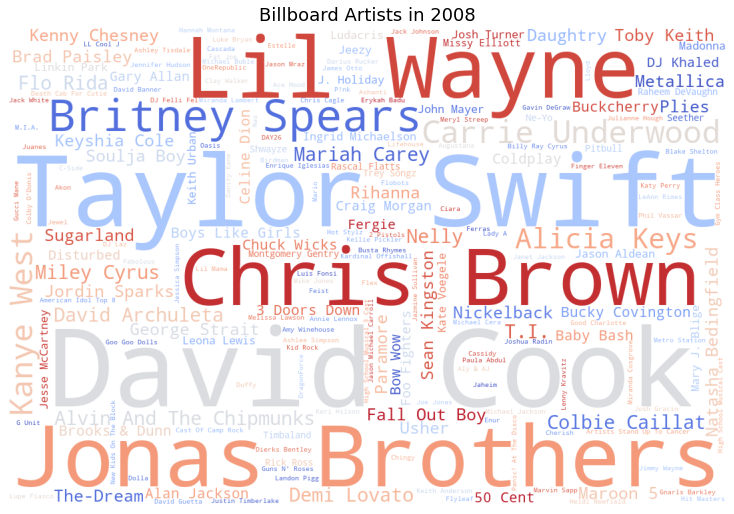

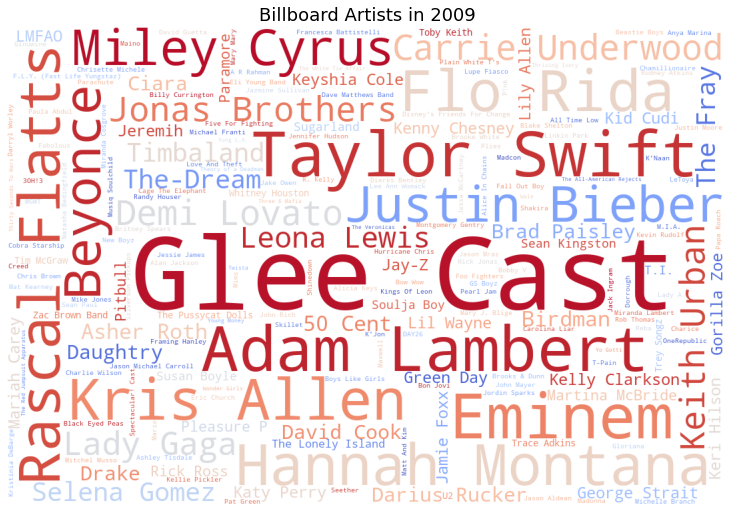

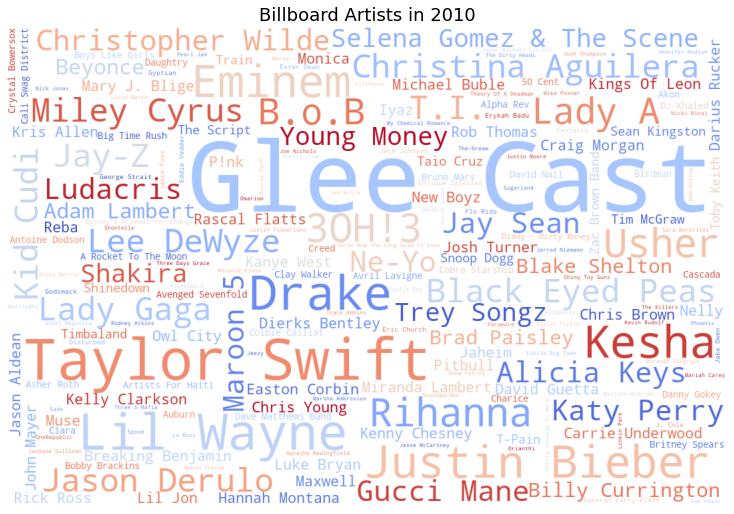

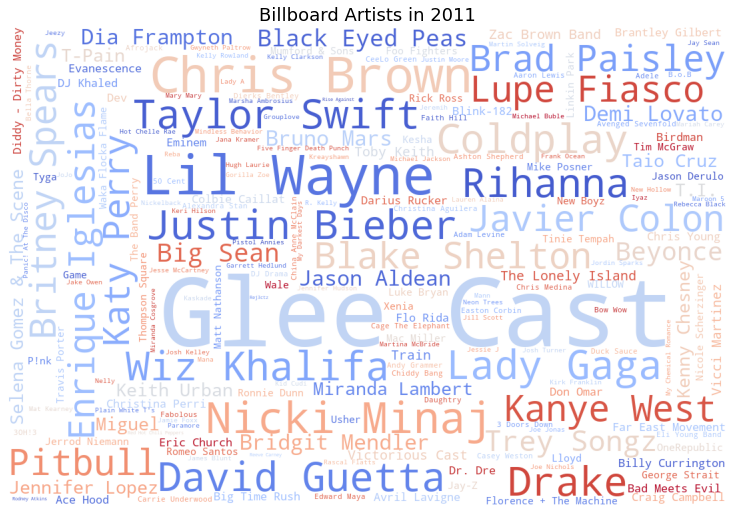

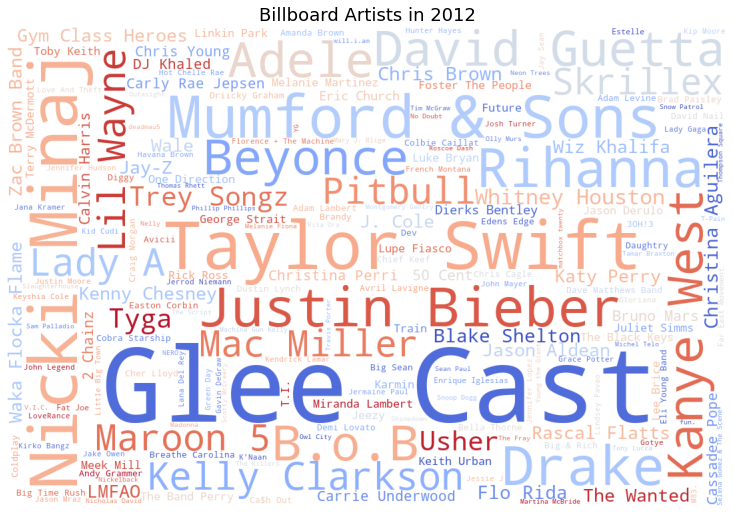

...

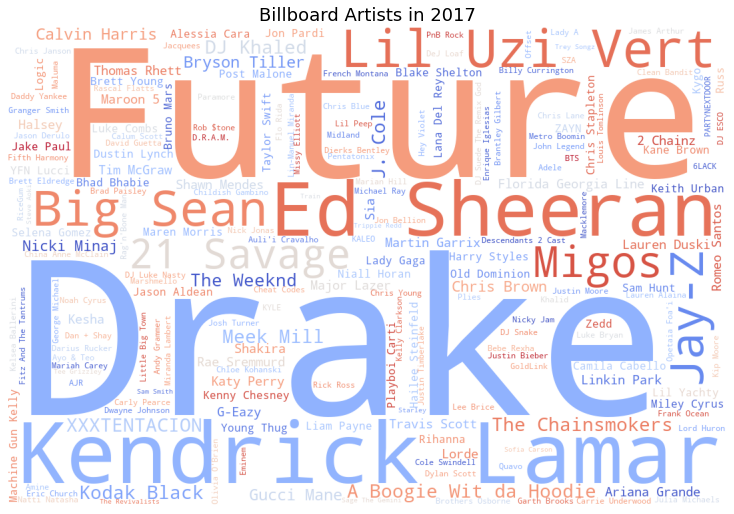

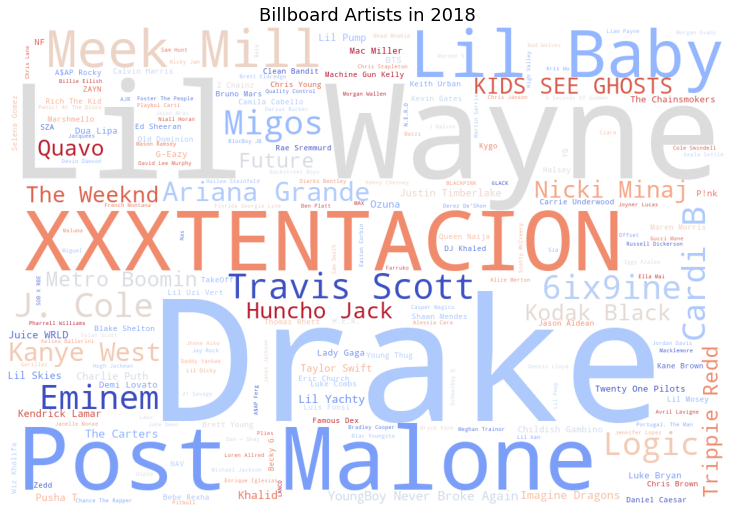

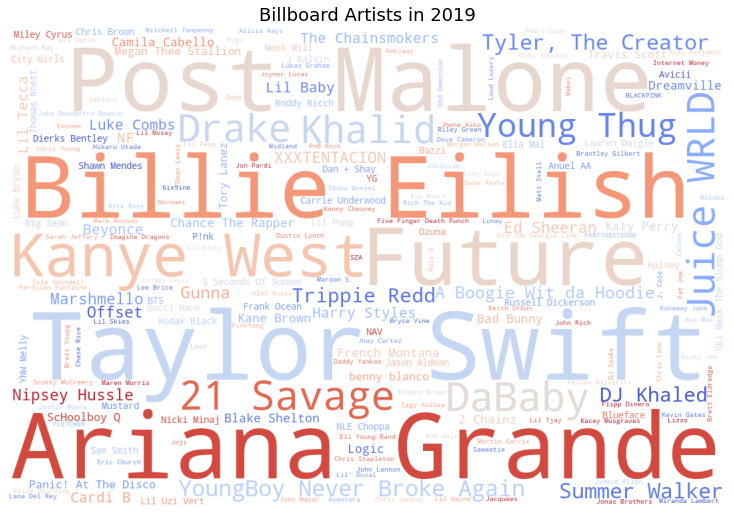

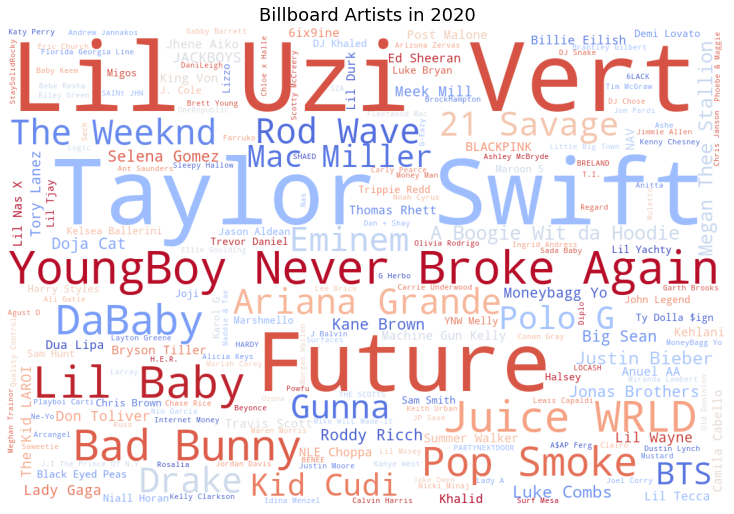

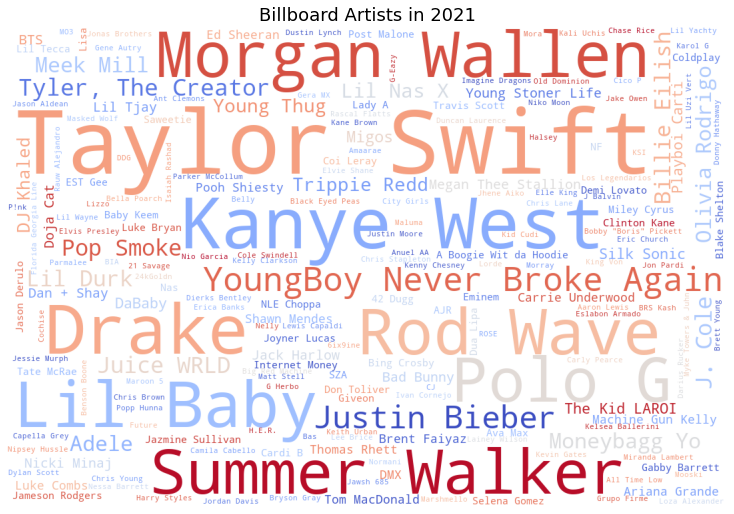

In [15]:
# show graphs

for key in artist_by_year:
    
    word_cloud.generate_from_frequencies(artist_by_year[key])
    
    plt.figure(figsize=(10,8))
    plt.imshow(word_cloud)
    plt.title(f'Billboard Artists in {key}', fontsize=18)
    plt.axis("off")
    plt.tight_layout(pad = 0)
    plt.show()
    print('')

We see in earlier years that major label artists like Christ Brown, Jonas Brothers, Eminem, Beyonce, etc. had taken over the Billboard charts. Songs from T.V. shows (most notably "Glee" and "American Idol") have popularized songs that had not reached the Billboard when they were initially released by the original artists. Perhaps *reminiscence* is a large factor for determining a song's success.

---
### Duration of Song Listings on Billboard Hot100<a class="anchor" id="duration"></a>

In [16]:
bb_df.head()

,billboard,billboard_year,billboard_month,peak_position,weeks_on_chart,artist,feat_artist,artist_uri,artist_popularity,artist_followers,song,track_uri,track_popularity,album_name,release_year,release_month,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,major_label,genre_pop,genre_screen,genre_hiphop,genre_punk,genre_blues,genre_country,genre_rnb,genre_rock,genre_latin,genre_dance,genre_indie,genre_elect,genre_gospel,genre_chill,billboard_yearmonth,release_yearmonth
5,1,2014,8,39,2,"""Weird Al"" Yankovic",-,1bDWGdIC2hardyt55nlQgG,56,647861,Word Crimes,4JqQWAr47pGEoaMArpA7Z3,48,Mandatory Fun,2014,7,223120,0.897,0.430,7,-12.759,1,0.0551,0.0118,0.000000,0.0473,0.964,121.987,4,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,2014-08-01,2014-07-01
7,1,2022,2,87,1,$NOT,A$AP Rocky,5IbEL2xjRtKsunfmsahLuO,72,1097721,Doja,3zpGLSQ8QbbUnNjweWPLMD,68,Doja,2022,2,171453,0.753,0.777,11,-5.701,0,0.3200,0.0725,0.000714,0.1250,0.669,157.148,4,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,2022-02-01,2022-02-01
32,1,2017,6,55,12,2 Chainz,Travis Scott,17lzZA2AlOHwCwFALHttmp,76,7197045,4:00 AM,1nX9KhK3Fff27SnrIor2Yb,66,Pretty Girls Like Trap Music,2017,6,255560,0.796,0.500,1,-7.210,1,0.4250,0.1180,0.000000,0.1550,0.227,75.012,4,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,2017-06-01,2017-06-01
33,1,2018,6,53,2,2 Chainz,"Drake, Quavo",17lzZA2AlOHwCwFALHttmp,76,7197045,Bigger Than You,5S1IUPueD0xE0vj4zU3nSf,59,Bigger Than You feat. Drake & Quavo,2018,6,225893,0.888,0.515,1,-6.246,1,0.2710,0.2470,0.000000,0.4460,0.264,141.009,4,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,2018-06-01,2018-06-01
34,1,2013,1,47,20,2 Chainz,Kanye West,17lzZA2AlOHwCwFALHttmp,76,7197045,Birthday Song,5qkWTBmDmZjogwIvbKtJQv,55,Based On A T.R.U. Story (Deluxe),2012,8,306600,0.753,0.590,1,-2.623,1,0.0485,0.0591,0.000000,0.1500,0.161,140.002,4,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,2013-01-01,2012-08-01


In [17]:
fig = px.box(data_frame=bb_df[bb_df['billboard_year']<2022],
             x='billboard_year',
             y='weeks_on_chart',
             title='Duration of Song Listings',
             labels={
                 'billboard_year':'Billboard Year',
                 'weeks_on_chart':'Duration (Weeks)'},
            color='billboard_year')

fig.update_layout(plot_bgcolor = 'rgba(0, 0, 0, 0)',
                  showlegend=False)

fig.update_xaxes(linewidth = 1, linecolor ='black')
fig.update_yaxes(linewidth = 1, linecolor ='black')

fig.show()

We found in our research that major label artists had been losing share since 2017. Based on the box plot above, it is interesting to see that the `weeks_on_chart` features may be correlated with that analysis. Starting from 2016 onwards, we see that the median (center line) is decreasing each year, meaning songs are on the charts for a shorter amount of time and there is probably a higher turnover of songs. That is not to say that a hit song can't stay on the chart for several months. Although listed as outliers (dots above box), artists still have the potential to hit months-long Billboard hits.

---
### Topic Trends<a class="anchor" id="topics"></a>

In [26]:
# load pickle file
topic_df = pd.read_pickle('topic_model.pkl')

In [27]:
# filter 2022 (not enough songs)
topic_df = topic_df[topic_df['billboard_year'] < 2022]

# create a record for topic '3' with zero count
for year in np.arange(2008,2022):
    topic_dict = {}
    topic_dict['billboard_year'] = year
    topic_dict['topic'] = 3
    topic_dict['billboard'] = 0
    topic_df = topic_df.append(topic_dict, ignore_index = True)
    
# re-group
topic_df = topic_df.groupby(['billboard_year', 'topic'])['billboard'].sum().reset_index()

# rename topic columns
topic_df['topic'] = topic_df['topic'].map({
    0:'Romantic & Heartbreak',
    1:'Hardcore & Life',
    2:'Explicit & Fiesta',
    3:'Sexy & Love'
})

In [28]:
fig = px.line(data_frame=topic_df,
              x='billboard_year',
              y='billboard',
              title='Topic Trends on Billboard Hot100',
              color='topic',
              labels={
                  'billboard_year':'Billboard Year',
                  'billboard':'Song Count',
                  'topic':'Song Topics:'},
             markers=True)

fig.update_layout(plot_bgcolor = 'rgba(0, 0, 0, 0)' )
fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='lightgrey')
fig.show()

Songs about Romance and Heartbreak have always been popular and continues to grow more popular. On the contrary, Hardcore songs/songs about Life are seeing a decline. Explicit songs and songs about Fiesta (i.e. Latin/Spanish music) are seeing an uptick in recent years. This could be the result of how music is becoming more globalized.

---

<center>2022 BrainStation Capstone Project
    <br>"Is the song <i>hot enough</i> for Billboard Hot100?"
    <br>by Hailey Lee</center>